In [17]:
sys.path.append("../")
from utils import sh_utils

In [3]:
import os

CHECKPOINT_PATH = os.path.join("/home/dimakot55/data/extra_models_weights/sam_vit_h_4b8939.pth")
print(CHECKPOINT_PATH, "; exist:", os.path.isfile(CHECKPOINT_PATH))
import torch

DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
MODEL_TYPE = "vit_h"

from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
from PIL import Image
import supervision as sv
import numpy as np
from matplotlib import pyplot as plt
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)
sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)

mask_generator = SamAutomaticMaskGenerator(sam)

/home/dimakot55/data/extra_models_weights/sam_vit_h_4b8939.pth ; exist: True


### Code for 3D visualization



In [4]:

# Functions from @Mateen Ulhaq and @karlo for visualizing 3d points with equal scaling of axes
def set_axes_equal(ax: plt.Axes):
    """Set 3D plot axes to equal scale.

    Make axes of 3D plot have equal scale so that spheres appear as
    spheres and cubes as cubes.  Required since `ax.axis('equal')`
    and `ax.set_aspect('equal')` don't work on 3D.
    """
    limits = np.array([
        ax.get_xlim3d(),
        ax.get_ylim3d(),
        ax.get_zlim3d(),
    ])
    origin = np.mean(limits, axis=1)
    radius = 0.5 * np.max(np.abs(limits[:, 1] - limits[:, 0]))
    _set_axes_radius(ax, origin, radius)

def _set_axes_radius(ax, origin, radius):
    x, y, z = origin
    ax.set_xlim3d([x - radius, x + radius])
    ax.set_ylim3d([y - radius, y + radius])
    ax.set_zlim3d([z - radius, z + radius])


# Initialize content scene

In [5]:
from PIL import Image
import numpy as np 
import os 


import numpy as np
import matplotlib.pyplot as pl
import torch
import ot
import ot.plot

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Enable interactive mode
%matplotlib ipympl
os.environ["CUDA_VISIBLE_DEVICES"] = "1" # has not effect

import sys
sys.path.append("../")
device="cuda"
from tqdm import tqdm_notebook as tqdm

from gaussian_renderer import render, network_gui
from arguments import ModelParams, PipelineParams, OptimizationParams
import argparse
from scene import Scene, GaussianModel
from random import randint
from argparse import ArgumentParser, Namespace

saving_steps = [1, 100, 300, 1_000, 3_000, 7_000, 10_000, 15_000, 20_000, 30_000]
parser = ArgumentParser(description="Training script parameters")
lp = ModelParams(parser)
op = OptimizationParams(parser)
pp = PipelineParams(parser)
parser.add_argument('--ip', type=str, default="127.0.0.1")
parser.add_argument('--port', type=int, default=6009)
parser.add_argument('--debug_from', type=int, default=-1)
parser.add_argument('--detect_anomaly', action='store_true', default=False)
parser.add_argument("--test_iterations", nargs="+", type=int, default=saving_steps)
parser.add_argument("--save_iterations", nargs="+", type=int, default=saving_steps)
parser.add_argument("--quiet", action="store_true")
parser.add_argument("--checkpoint_iterations", nargs="+", type=int, default=saving_steps)# default=[])
parser.add_argument("--start_checkpoint", type=str, default = None)
args = parser.parse_args(("-s /home/dimakot55/data/nerf_synthetic/hotdog/ "+\
                         "--model_path /home/dimakot55/workspace/gaussian-splatting/notebooks/GT_lego_cluster2_test_notebook14/").split())#sys.argv[1:])
#args.save_iterations.append(args.iterations)
dataset=lp.extract(args)
pipe=pp.extract(args)
opt=op.extract(args)
os.makedirs(args.model_path, exist_ok=True)

In [6]:
os.makedirs(args.model_path, exist_ok=True)
content_gaussians = GaussianModel(3)
content_scene = Scene(dataset, content_gaussians, shuffle=False)
content_gaussians.training_setup(opt)

Found transforms_train.json file, assuming Blender data set!
Reading Training Transforms
Reading Test Transforms
Loading Training Cameras
Loading Test Cameras
Number of points at initialisation :  100000


In [7]:
PATH_TO_CKPT = "/home/dimakot55/output_data/content_scenes_fitted/GT_hotdog/chkpnt30000.pth"
content_gaussians.restore(torch.load(PATH_TO_CKPT)[0], opt)

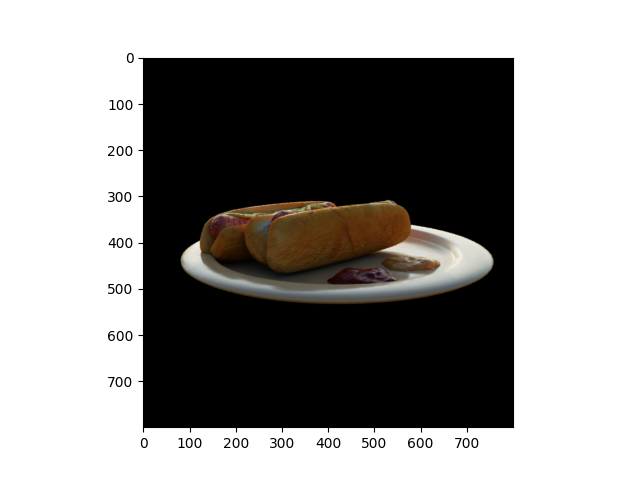

In [8]:

viewpoint_stack = content_scene.getTrainCameras().copy()

viewpoint_cam = viewpoint_stack[15]

bg_color = [1, 1, 1] if dataset.white_background else [0, 0, 0]
background = torch.tensor(bg_color, dtype=torch.float32, device=device)
render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()

In [9]:
os.makedirs(args.model_path, exist_ok=True)
gaussians_opt = GaussianModel(3)
opt_scene = Scene(dataset, gaussians_opt, shuffle=False)
gaussians_opt.training_setup(opt)


Found transforms_train.json file, assuming Blender data set!
Reading Training Transforms
Reading Test Transforms
Loading Training Cameras
Loading Test Cameras
Number of points at initialisation :  100000


In [10]:
PATH_TO_CKPT = "/home/dimakot55/output_data/notebooks_data/fit_hotdog_rocks4_pebbles_rosebush_v1_converged3/chkpnt1.pth"
PATH_TO_CKPT = "/home/dimakot55/output_data/notebooks_data/fit_hotdog_with_lego_200clusters_shaded/chkpnt1.pth"
gaussians_opt.restore(torch.load(PATH_TO_CKPT)[0], opt)

In [11]:
# PATH_TO_CKPT = "/home/dimakot55/output_data/notebooks_data/fit_hotdog_rocks4_pebbles_rosebush_v1_converged3/chkpnt1.pth"
# gaussians_opt.restore(torch.load(PATH_TO_CKPT)[0], opt)

In [12]:
! ls fit_hotdog_with_pebbles_bark_fragment_rocks4_init_28notebook

camera_paths  cfg_args	   input.ply	point_cloud
cameras.json  chkpnt1.pth  iteration_1


In [13]:
# PATH_TO_CKPT = "fit_hotdog_with_pebbles_bark_fragment_rocks4_init_28notebook/chkpnt1.pth"
# gaussians_opt.restore(torch.load(PATH_TO_CKPT)[0], opt)

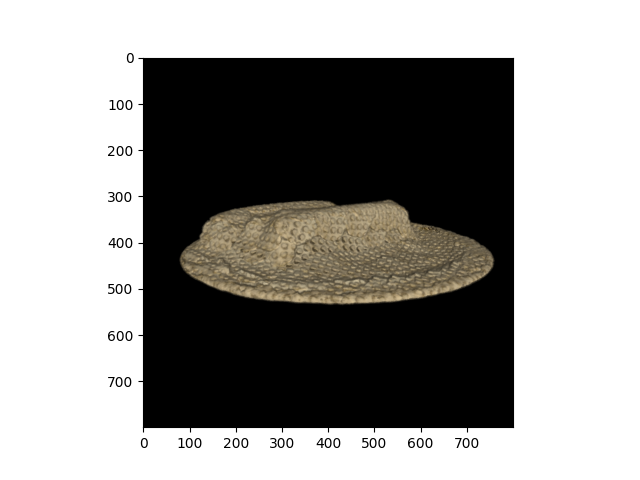

In [14]:

render_pkg_opt = render(viewpoint_cam, gaussians_opt, pipe, background)
image_cont, depth_cont= render_pkg_opt["render"], render_pkg_opt["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()

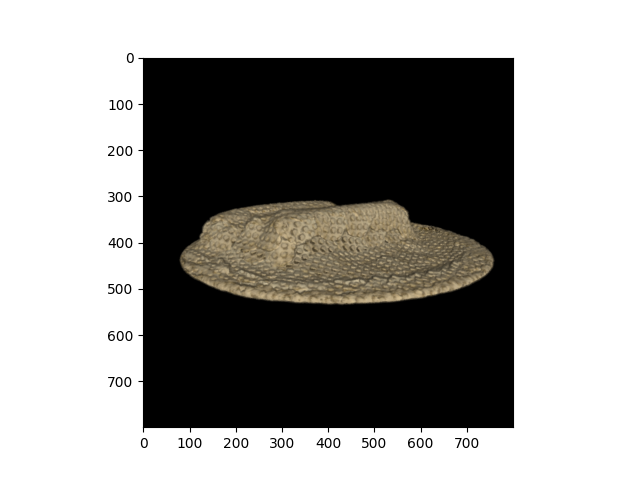

In [15]:

render_pkg_opt = render(viewpoint_cam, gaussians_opt, pipe, background)
image_cont, depth_cont= render_pkg_opt["render"], render_pkg_opt["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()

In [25]:
def sigmoid(x):
  return 1 / (1 + np.exp(-x))
def sigmoid_inverse(x):
    return -np.log(1/x -1.)

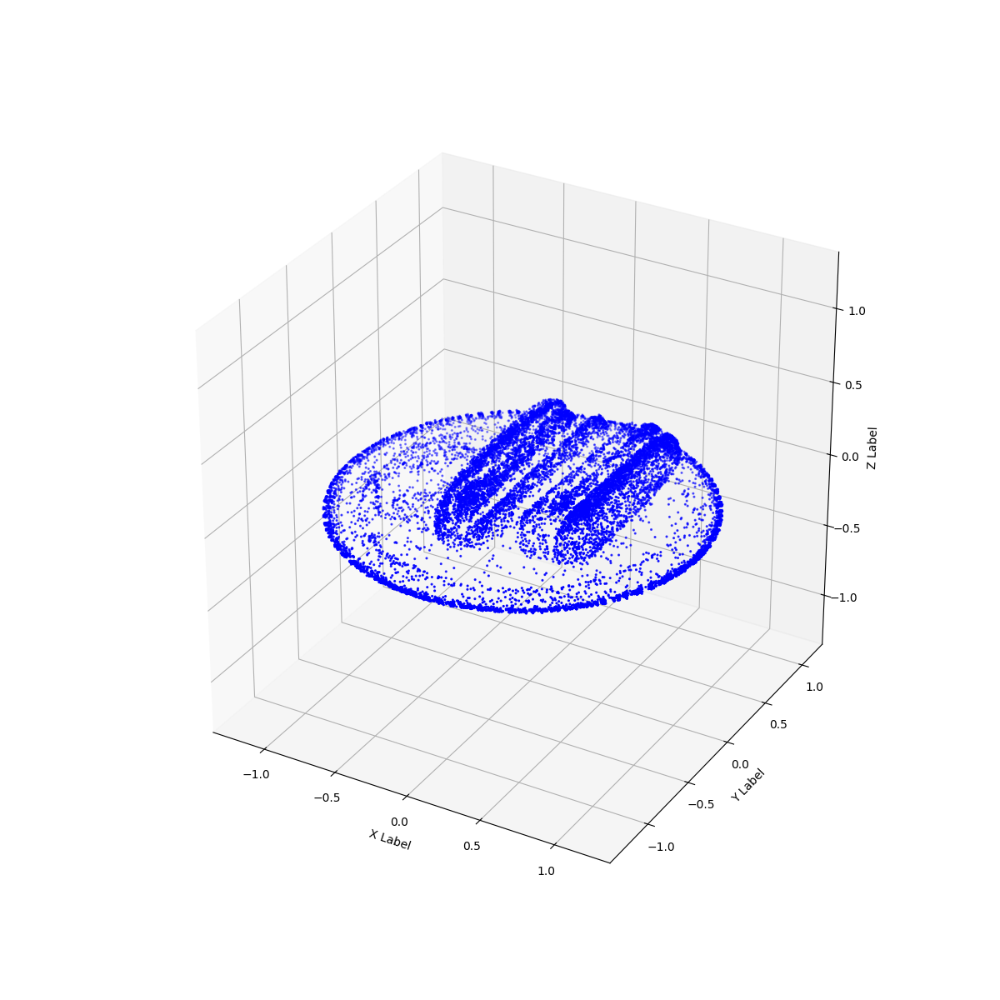

In [16]:


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=10
if True:
    arr = content_gaussians._xyz.data.detach().cpu().numpy()
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='b', marker='o',s=1.5)


# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()


In [19]:

def obtain_surface_pc(viewpoint_stack, gaussians, pipe, background, num_viewpoints=40, pc_size=20000):
    import numpy as np
    import skimage.measure, skimage.morphology
    import scipy

    # 1. Render from different viewpoints and extract points
    all_points = []
    for iter in range(min(num_viewpoints, len(viewpoint_stack))):
        viewpoint_cam = viewpoint_stack.pop(randint(0, len(viewpoint_stack)-1))
        render_pkg_cont = render(viewpoint_cam, gaussians, pipe, background)
        image = render_pkg_cont["render"]
        image_rgb = image.detach().cpu().numpy().transpose(1, 2, 0)
        image_maxpool = skimage.measure.block_reduce(image_rgb, (3,3,1), np.max)
        mask = scipy.ndimage.binary_erosion(np.max(image_maxpool, axis=-1) > 0.05, structure=None, iterations=3)
        image_clean = image_maxpool * np.expand_dims(mask, axis=-1)
        all_points += list(image_clean[np.min(image_clean, axis=-1)>0.05])
    
    
    # 2. Subsample the points 
    all_points = np.array(all_points)
    all_points_idcs = np.random.choice(range(len(all_points)), size=pc_size, replace=False) 
    all_points = all_points[all_points_idcs]

    # 3. Remove poitns that are too far away from all other points.
    # Compute all pairwise distances between points
    from scipy.spatial import distance
    k=10
    pairwise_distances = distance.cdist(all_points, all_points, 'euclidean')
    # Use np.partition to find the k-th smallest distances for each row
    kth_nearest_indices = np.argpartition(pairwise_distances, k, axis=1)[:, :k]
    kth_nearest_distances = np.take_along_axis(pairwise_distances, kth_nearest_indices, axis=1)
    q_outliers = np.quantile(np.max(kth_nearest_distances, axis=-1), 0.95)
    idcs = np.where(np.max(kth_nearest_distances, axis=-1) < q_outliers)[0]
    all_points = all_points[idcs]
    return all_points

In [20]:
kth_viewpoint = 5
# 1. Get target points representing the mesh
content_gaussians._opacity.data +=  1e6
content_gaussians_features_ds_original = content_gaussians._features_dc.detach().clone()
content_gaussians_features_rest_original = content_gaussians._features_rest.detach().clone()
content_gaussians._features_dc.data = content_gaussians._xyz.data.clone().detach().unsqueeze(1)
#content_gaussians._features_dc.data = sh_utils.RGB2SH(content_gaussians._xyz.data.clone().detach().unsqueeze(1))
content_gaussians._features_rest.data = content_gaussians._features_rest.data * 0.

content_surface_pc = obtain_surface_pc(viewpoint_stack=viewpoint_stack, 
                               gaussians=content_gaussians, 
                               pipe=pipe, 
                               background=background,
                               num_viewpoints=40)
content_surface_pc=sh_utils.RGB2SH(content_surface_pc)
content_gaussians.restore(torch.load(PATH_TO_CKPT)[0], opt)




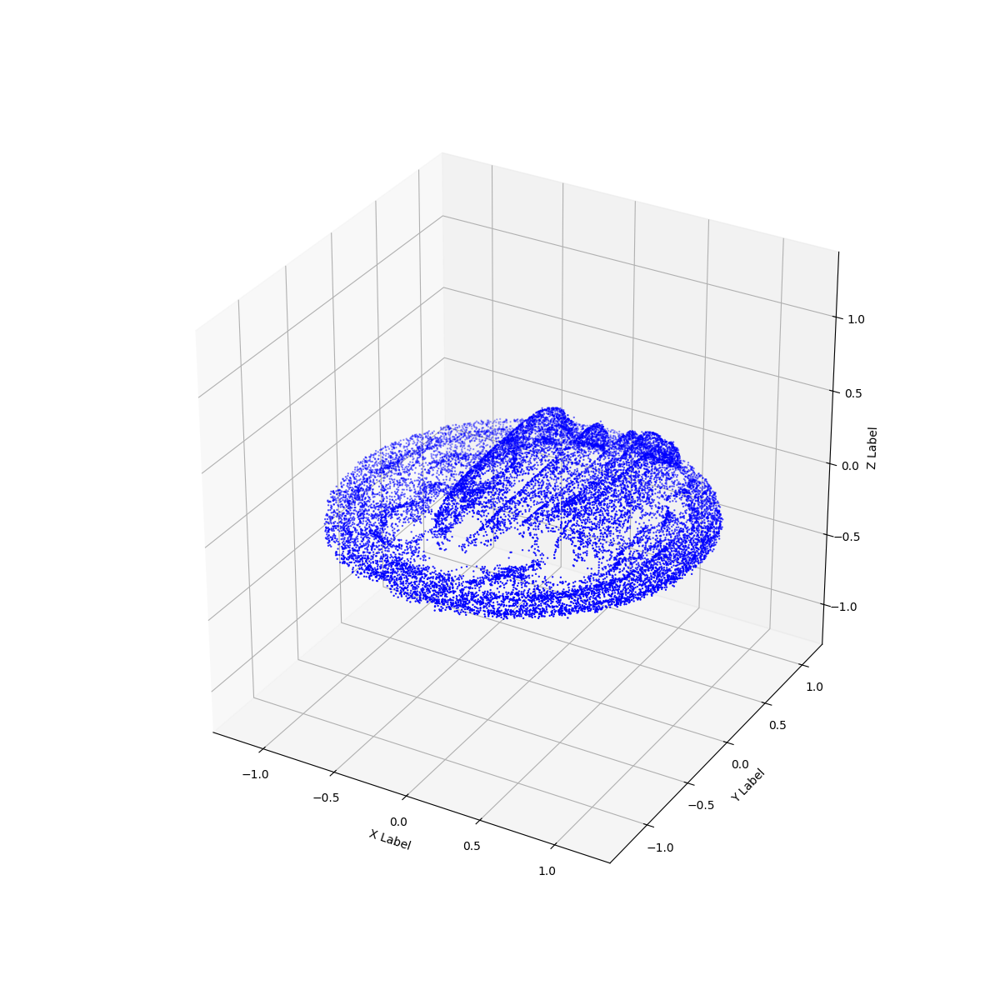

In [23]:


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=1
if True:
    arr = content_surface_pc
    #arr = sh_utils.RGB2SH(content_surface_pc)
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='b', marker='o',s=.5)

# Plot the scatter points
kth=30
if False:
    arr = content_gaussians._xyz.data.detach().cpu().numpy()
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='r', marker='o',s=.5)


# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()


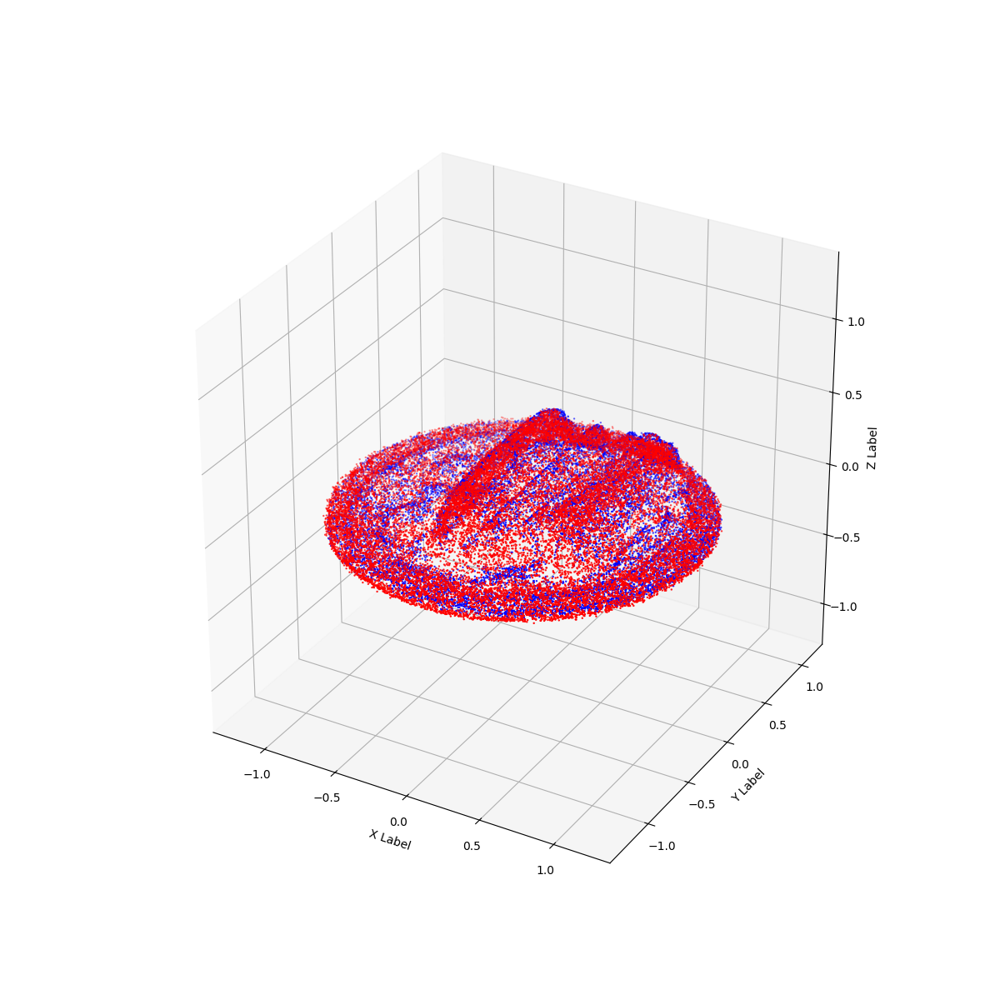

In [22]:


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=1
if True:
    arr = content_surface_pc
    #arr = sh_utils.RGB2SH(content_surface_pc)
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='b', marker='o',s=.5)

# Plot the scatter points
kth=30
if True:
    arr = content_gaussians._xyz.data.detach().cpu().numpy()
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='r', marker='o',s=.5)


# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()


# Load results with SAM masks

In [24]:
import pickle
with open('/home/dimakot55/output_data/notebooks_data/results_hotdog_SAM2.pkl', 'rb') as handle:
    results = pickle.load(handle)

/tmp/ipykernel_322579/4247447911.py:2: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  summed_masks = np.sum(results[viewpoint_cam_idx]["masks"][idx]*(2**idx)


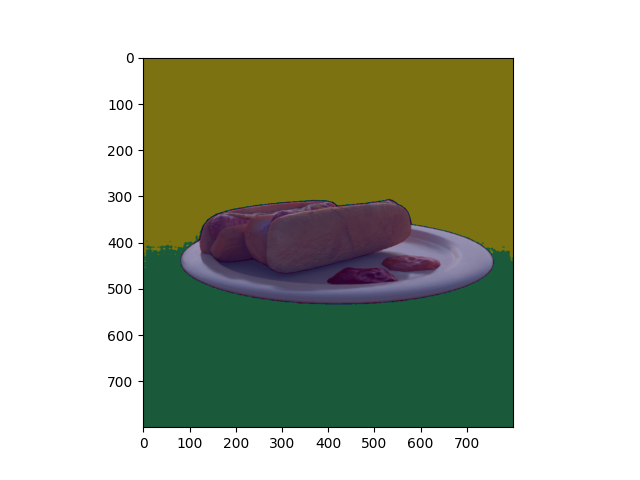

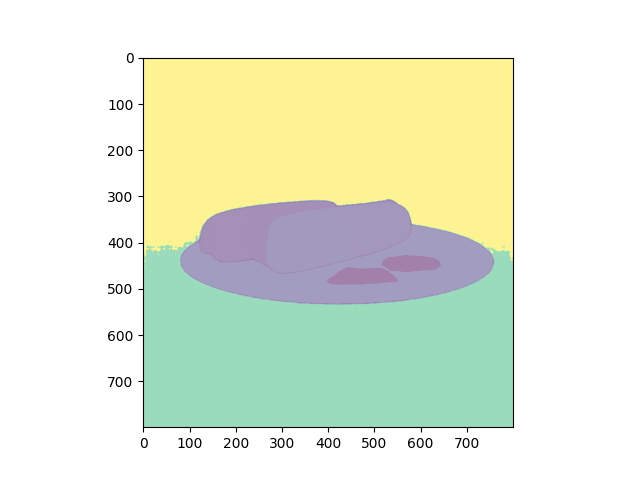

In [88]:
viewpoint_cam_idx = 15
summed_masks = np.sum(results[viewpoint_cam_idx]["masks"][idx]*(2**idx) 
                      for idx in range(len(results[viewpoint_cam_idx]["masks"])))
plt.figure()
plt.imshow(results[viewpoint_cam_idx]["image_rgb"])
plt.imshow(summed_masks, alpha=0.5)
plt.show()

plt.figure()
#plt.imshow(results[viewpoint_cam_idx]["image_rgb"])
plt.imshow(summed_masks, alpha=0.5)
plt.show()



In [89]:
lbls_surrogate, lbls_surrogate_count = np.unique(summed_masks,return_counts=True)
masks_surrogate = [summed_masks==lbl for lbl in np.unique(summed_masks)]

# remove zeros and remove those classes that are almost absent
idcs_to_leave = np.where(lbls_surrogate_count > 20*20)[0]
idcs_to_leave = [idx for idx in idcs_to_leave if lbls_surrogate[idx]!=0]

masks_surrogate=[masks_surrogate[idx] for idx in np.array(idcs_to_leave)]
lbls_surrogate=[lbls_surrogate[idx] for idx in np.array(idcs_to_leave)]


In [90]:
lbls_surrogate

[16, 96, 8192, 8194, 8196, 8320, 8712, 8960, 13312, 14336, 16384, 65536, 98304]

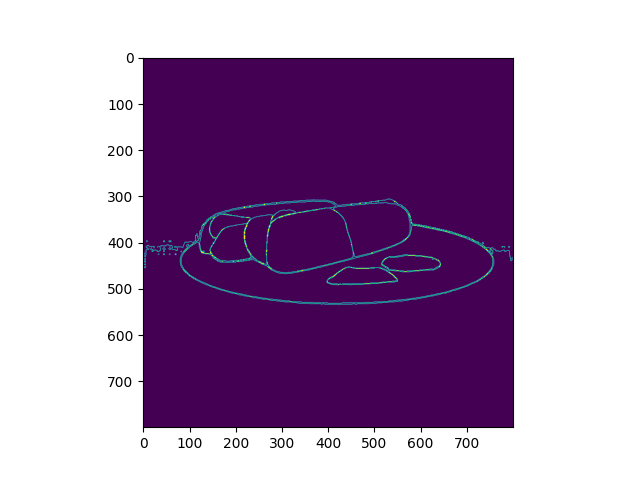

In [91]:
import cv2
edged = None
for mask in masks_surrogate:
    
    mask = np.array(mask).astype(np.uint8)*255
    if edged is not None:
        edged = edged + cv2.Canny(mask, 30, 200) 
    else:
        edged = cv2.Canny(mask, 30, 200) 
        
plt.figure()
plt.imshow(edged>0)
plt.show()

In [99]:
edged.shape

(800, 800)

In [109]:
#edged_processed = skimage.morphology.binary_dilation(edged, footprint=(3,3))
edged_processed = skimage.morphology.isotropic_dilation(edged, radius=2)

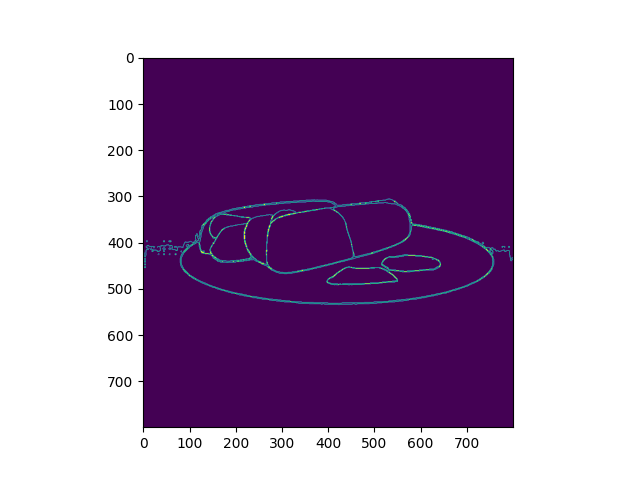

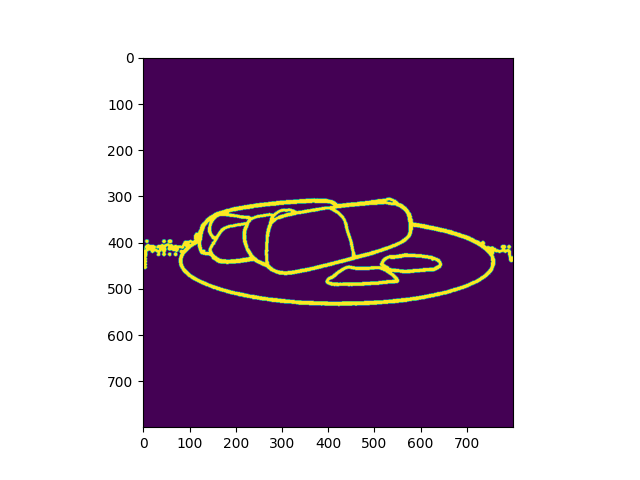

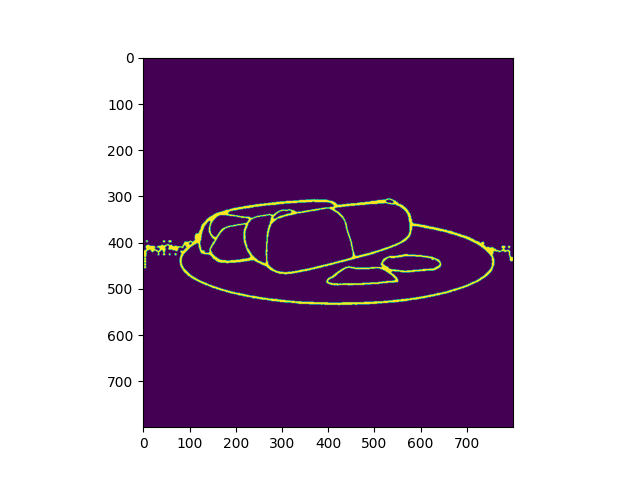

In [118]:
plt.figure()
plt.imshow(edged)
plt.show()

edged_processed = skimage.morphology.isotropic_dilation(edged>0, radius=3)
plt.figure()
plt.imshow(edged_processed)
plt.show()

edged_processed = skimage.morphology.isotropic_erosion(edged_processed, radius=2)
plt.figure()
plt.imshow(edged_processed)
plt.show()



In [115]:
np.unique(edged, return_counts=True)

(array([  0, 253, 254, 255], dtype=uint8),
 array([632429,      7,   1397,   6167]))

In [116]:
np.unique(edged_processed, return_counts=True)

(array([False,  True]), array([628560,  11440]))

In [92]:
image_maxpool = skimage.measure.block_reduce(image_rgb, (3,3,1), np.max)
mask = scipy.ndimage.binary_erosion(np.max(image_maxpool, axis=-1) > 0.05, structure=None, iterations=3)


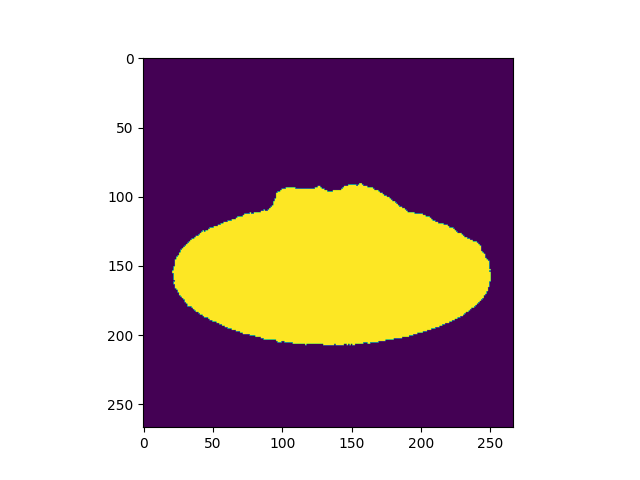

In [96]:
plt.figure()
plt.imshow(mask)
plt.show()


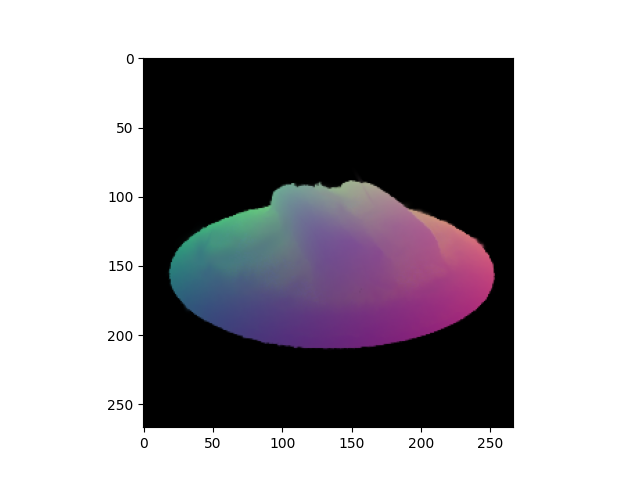

ValueError: operands could not be broadcast together with shapes (267,267,3) (800,800,1) 

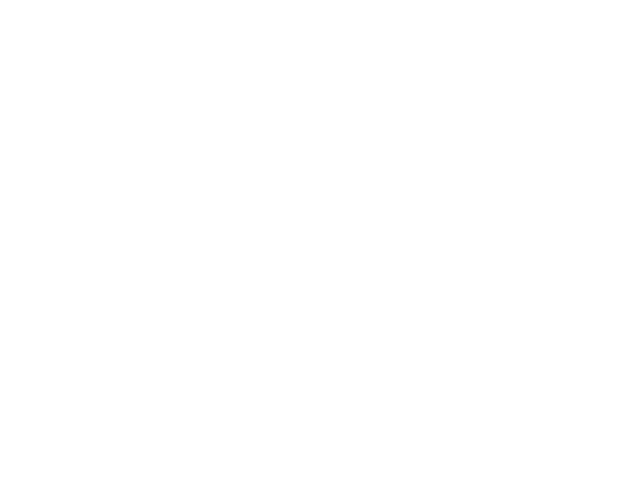

In [97]:
plt.figure()
plt.imshow(image_maxpool)
plt.show()

plt.figure()
plt.imshow(image_maxpool * np.expand_dims(edged , axis=-1))
plt.show()

In [78]:
import skimage.measure, skimage.morphology
import scipy
image_maxpool = skimage.measure.block_reduce(image_rgb, (3,3,1), np.max)
mask = scipy.ndimage.binary_erosion(np.max(image_maxpool, axis=-1) > 0.05, structure=None, iterations=3)
image_clean = image_maxpool * np.expand_dims(mask, axis=-1)
    #all_points += list(image_clean[np.min(image_clean, axis=-1)>0.05])

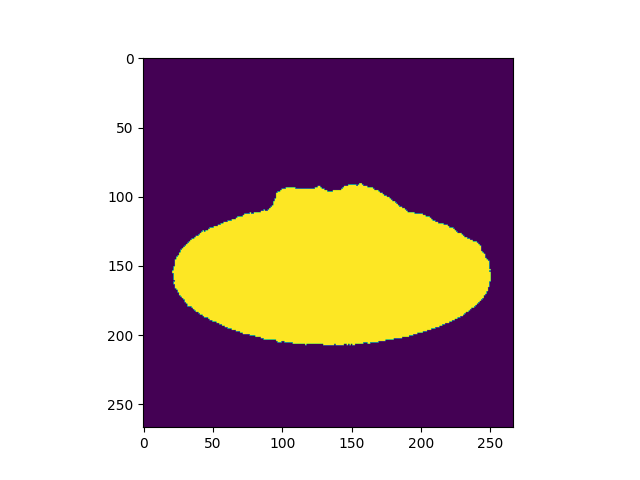

In [80]:
plt.figure()
plt.imshow(mask)
plt.show()

In [29]:
mask = torch.tensor(edged > 0, dtype=torch.float32).to("cuda")
image_target = image_cont.detach().clone()

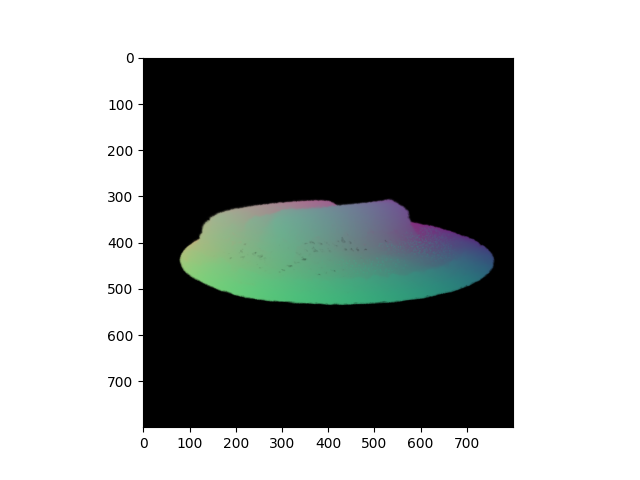

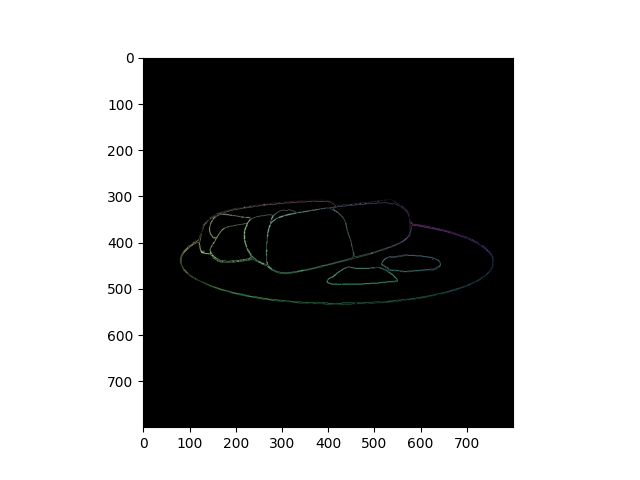

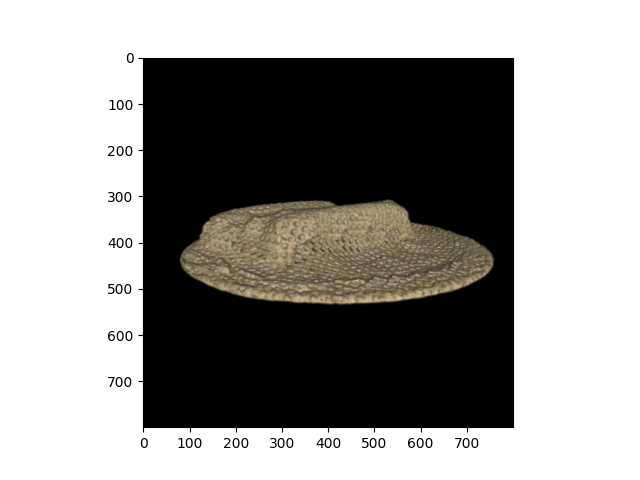

In [30]:
gaussians_opt_features_dc_original = gaussians_opt._features_dc.detach().clone()
gaussians_opt_features_rest_original = gaussians_opt._features_rest.detach().clone()
gaussians_opt._features_dc.data = gaussians_opt._xyz.data.clone().detach().unsqueeze(1)
#content_gaussians._features_dc.data = sh_utils.RGB2SH(content_gaussians._xyz.data.clone().detach().unsqueeze(1))
gaussians_opt._features_rest.data = gaussians_opt._features_rest.data * 0.


render_pkg_opt = render(viewpoint_cam, gaussians_opt, pipe, background)
image_cont, depth_cont= render_pkg_opt["render"], render_pkg_opt["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()



image_rgb = (image_cont*mask).detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


contours = (image_cont*mask).detach().clone()

gaussians_opt._features_dc.data = gaussians_opt_features_dc_original
gaussians_opt._features_rest.data = gaussians_opt_features_rest_original



render_pkg_opt = render(viewpoint_cam, gaussians_opt, pipe, background)
image_cont, depth_cont= render_pkg_opt["render"], render_pkg_opt["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)


image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()


In [31]:
# Find contour points.

In [32]:
h,w = torch.where(torch.max(contours, dim=0)[0]>0)
contours_coords_rgb = torch.stack([contours[0][h,w], contours[1][h,w], contours[2][h,w]], dim=1)

sys.path.append("../")
from utils import sh_utils
contours_coords_sh = sh_utils.RGB2SH(contours_coords_rgb)

In [33]:
contours_coords_sh

tensor([[-1.4693, -1.5707, -1.4096],
        [-1.4673, -1.5693, -1.4070],
        [-1.1753, -1.3759, -1.0630],
        ...,
        [-1.3418, -0.5862, -0.9684],
        [-1.4298, -0.8267, -1.1308],
        [-1.3160, -0.5123, -0.9175]], device='cuda:0')

In [34]:
contours_coords_sh.shape

torch.Size([7061, 3])

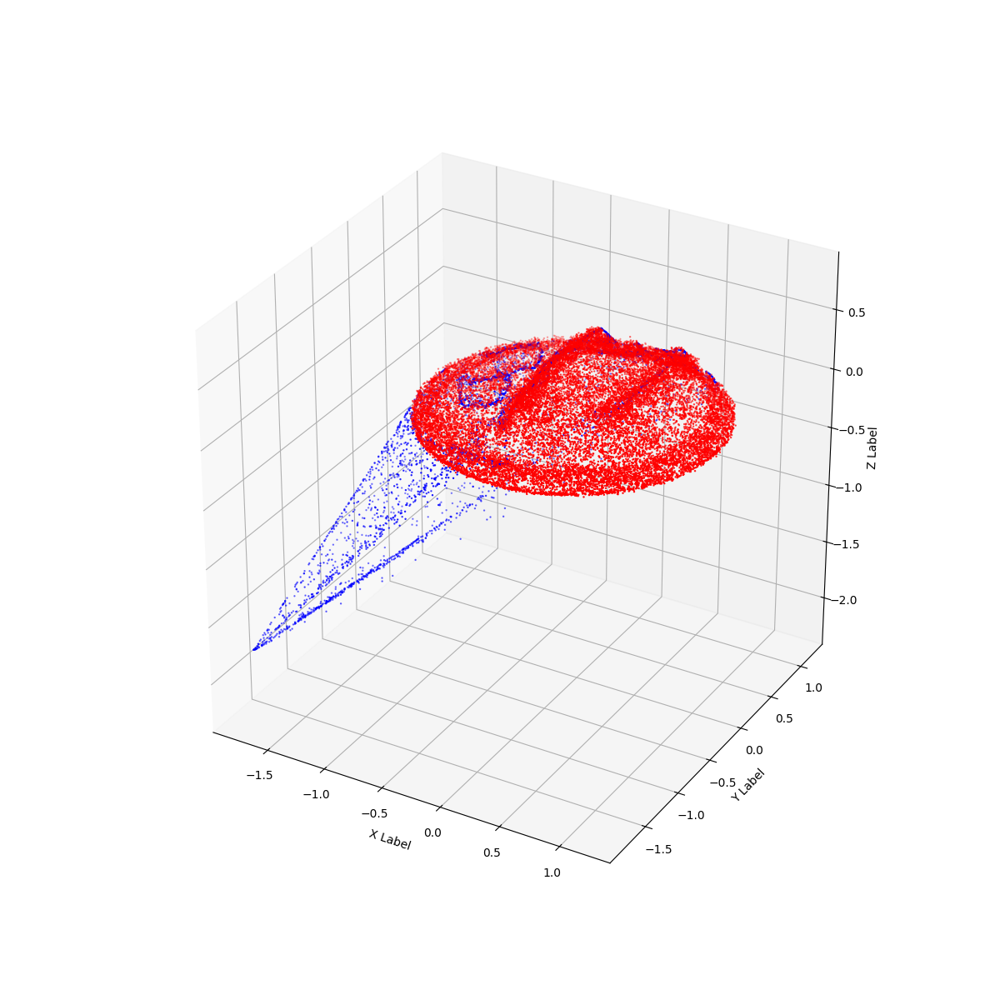

In [35]:


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=1
if True:
    arr = contours_coords_sh.detach().cpu().numpy()
    
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='b', marker='o',s=.5)

# Plot the scatter points
kth=30
if True:
    #arr = content_gaussians._xyz.data.detach().cpu().numpy()
    arr = gaussians_opt._xyz.data.detach().cpu().numpy()
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='r', marker='o',s=.5)


# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()


In [36]:
# Get 3D contours from all viewpoints

In [39]:
list(results.keys())[:10]

[0, 5, 10, 15, 20, 25, 30, 35, 40, 45]

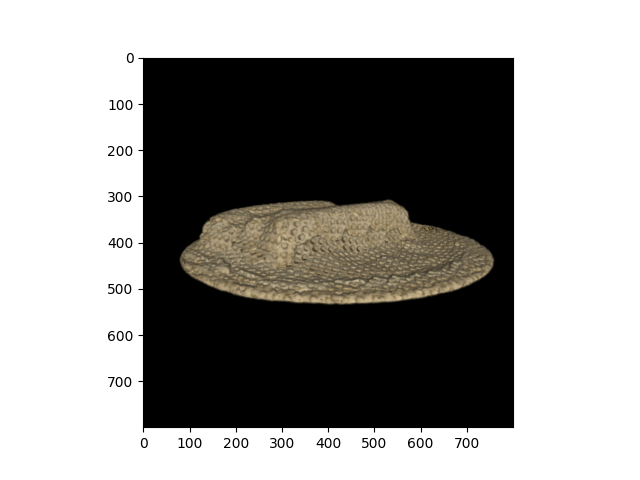

In [50]:

render_pkg_cont = render(viewpoint_cam, content_gaussians, pipe, background)
image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)

contours = (image_cont*mask).detach().clone()



image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
plt.figure()
plt.imshow(image_rgb)
plt.show()



In [53]:
results[viewpoint_cam_idx]

{'viewpoint_cam': Camera(),
 'image_rgb': array([[[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        ...,
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]],
 
        [[0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.],
         ...,
         [0., 0., 0.],
         [0., 0., 0.],
         [0., 0., 0.]]], dtype=float32),

In [167]:

content_gaussians.restore(torch.load("/home/dimakot55/output_data/content_scenes_fitted/GT_hotdog/chkpnt30000.pth")[0], opt)

/tmp/ipykernel_322579/1503877214.py:20: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for viewpoint_cam_idx in tqdm(list(results.keys())[:10]):


  0%|          | 0/10 [00:00<?, ?it/s]

/tmp/ipykernel_322579/1503877214.py:21: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  summed_masks = np.sum(results[viewpoint_cam_idx]["masks"][idx]*(2**idx)


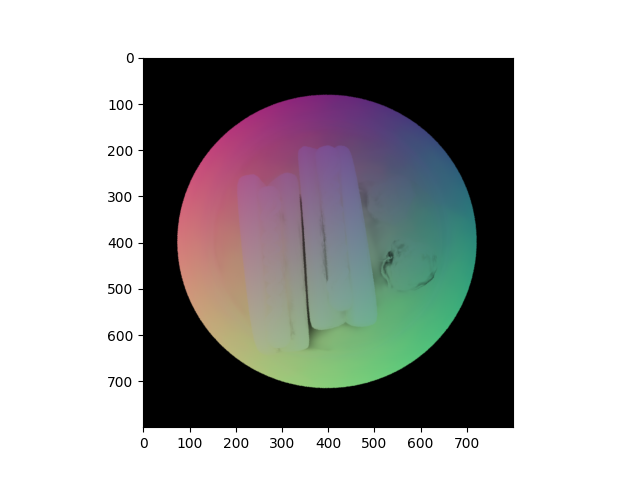

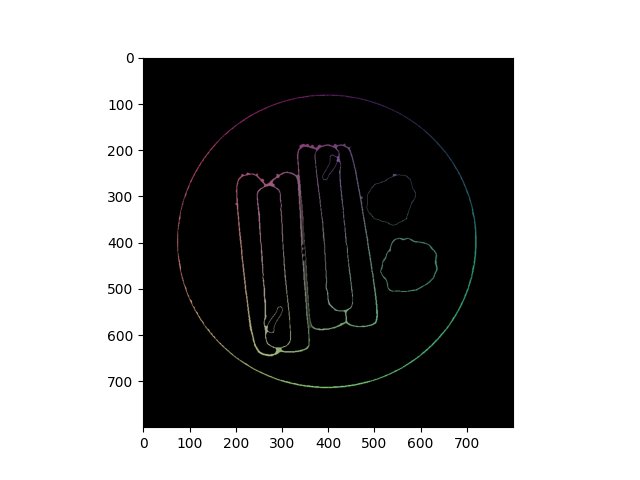

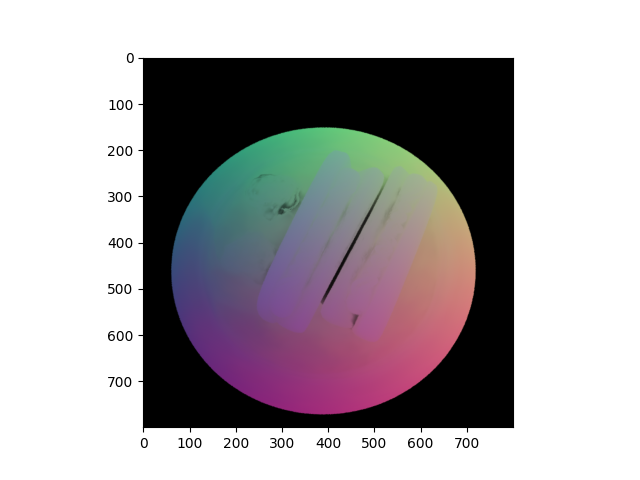

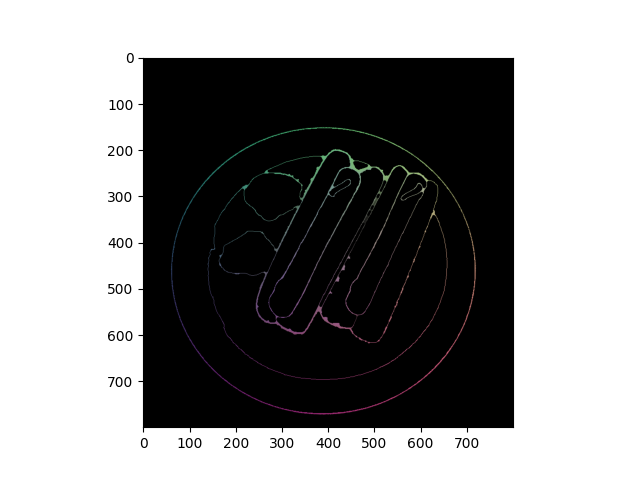

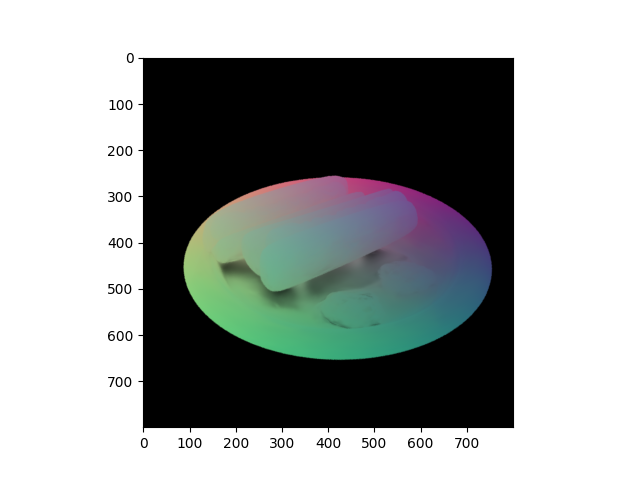

...

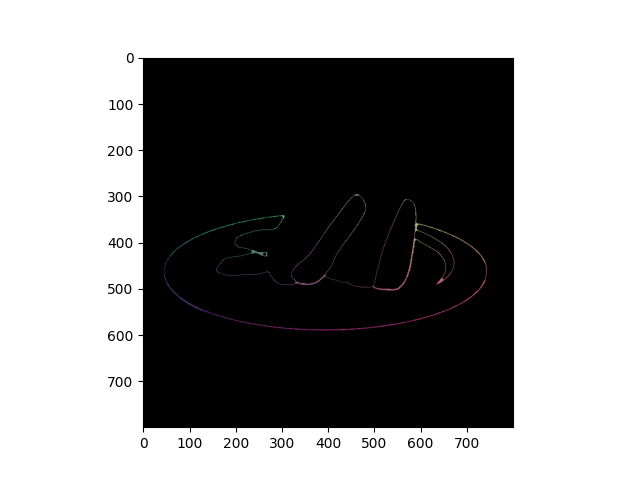

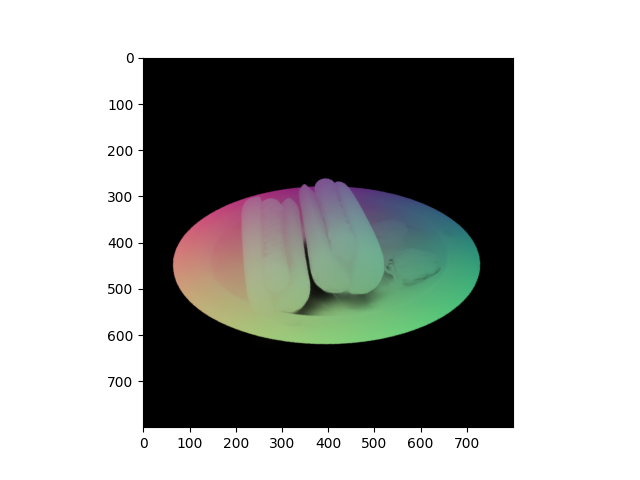

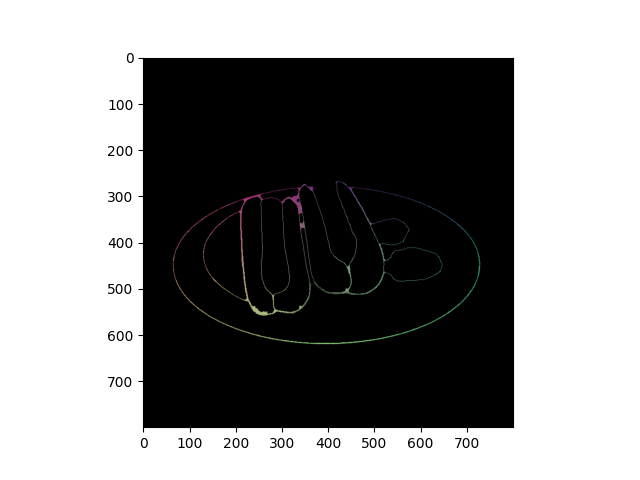

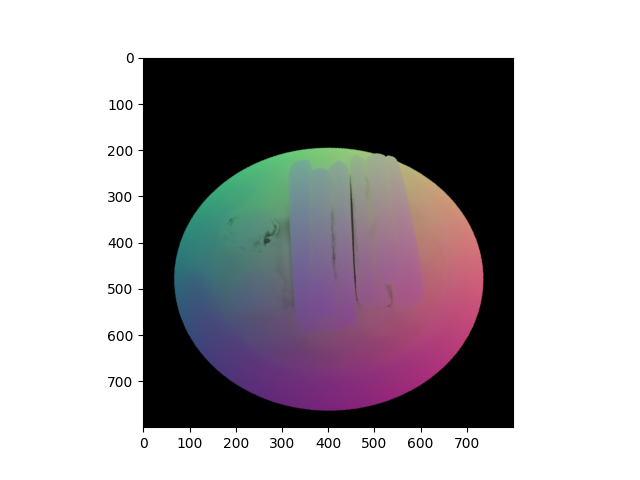

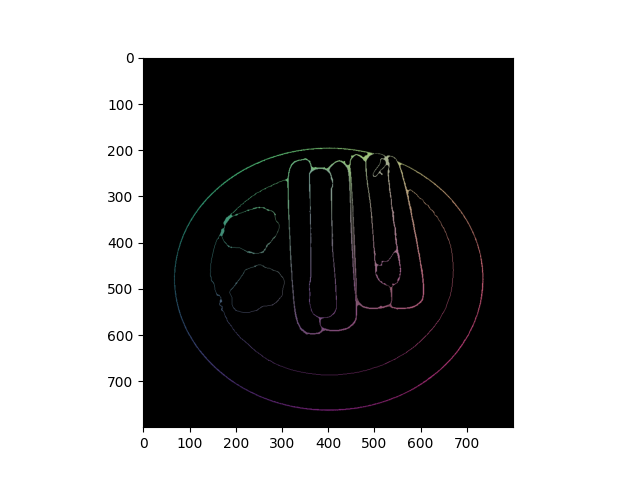

In [175]:
import cv2
from tqdm import tqdm_notebook as tqdm
all_contours_coords = []



# content_gaussians._opacity.data +=  1e6
content_gaussians_features_ds_original = content_gaussians._features_dc.detach().clone()
content_gaussians_features_rest_original = content_gaussians._features_rest.detach().clone()
content_gaussians._features_dc.data = content_gaussians._xyz.data.clone().detach().unsqueeze(1)
content_gaussians._features_rest.data = content_gaussians._features_rest.data * 0.








for viewpoint_cam_idx in tqdm(list(results.keys())[:10]):
    summed_masks = np.sum(results[viewpoint_cam_idx]["masks"][idx]*(2**idx) 
                          for idx in range(len(results[viewpoint_cam_idx]["masks"])))
    lbls_surrogate, lbls_surrogate_count = np.unique(summed_masks,return_counts=True)
    masks_surrogate = [summed_masks==lbl for lbl in np.unique(summed_masks)]
    
    # remove zeros and remove those classes that are almost absent
    idcs_to_leave = np.where(lbls_surrogate_count > 100*100)[0]
    idcs_to_leave = [idx for idx in idcs_to_leave if lbls_surrogate[idx]!=0]
    
    masks_surrogate=[masks_surrogate[idx] for idx in np.array(idcs_to_leave)]
    lbls_surrogate=[lbls_surrogate[idx] for idx in np.array(idcs_to_leave)]
    
    
    edged = None
    for mask in masks_surrogate:    
        mask = np.array(mask).astype(np.uint8)*255
        if edged is not None:
            edged = edged + cv2.Canny(mask, 30, 200) 
        else:
            edged = cv2.Canny(mask, 30, 200) 


    
    
    edged_processed = skimage.morphology.isotropic_dilation(edged>0, radius=3)
    edged_processed = skimage.morphology.isotropic_erosion(edged_processed, radius=3)
    #edged_processed = edged>0
    

    mask = torch.tensor(edged_processed, dtype=torch.float32).to("cuda")

    
    render_pkg_cont = render(results[viewpoint_cam_idx]["viewpoint_cam"], content_gaussians, pipe, background)
    image_cont, depth_cont= render_pkg_cont["render"], render_pkg_cont["depth"]
    image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
    
    contours = (image_cont*mask).detach().clone()
    
    
    
    image_rgb = image_cont.detach().cpu().numpy().transpose(1, 2, 0)
    if True:
        plt.figure()
        plt.imshow(image_rgb)
        plt.show()
        plt.figure()
        plt.imshow(contours.cpu().numpy().transpose(1, 2, 0))
        plt.show()
    
    
    

    image_target = contours.detach().clone()
    h,w = torch.where(torch.max(contours, dim=0)[0]>0)
    contours_coords_rgb = torch.stack([contours[0][h,w], contours[1][h,w], contours[2][h,w]], dim=1)
    contours_coords_sh = sh_utils.RGB2SH(contours_coords_rgb)
    all_contours_coords.append(contours_coords_sh)


content_gaussians.restore(torch.load("/home/dimakot55/output_data/content_scenes_fitted/GT_hotdog/chkpnt30000.pth")[0], opt)


In [176]:
all_contours_coords = torch.concat(all_contours_coords, dim=0)

In [177]:
all_contours_coords.shape

torch.Size([125413, 3])

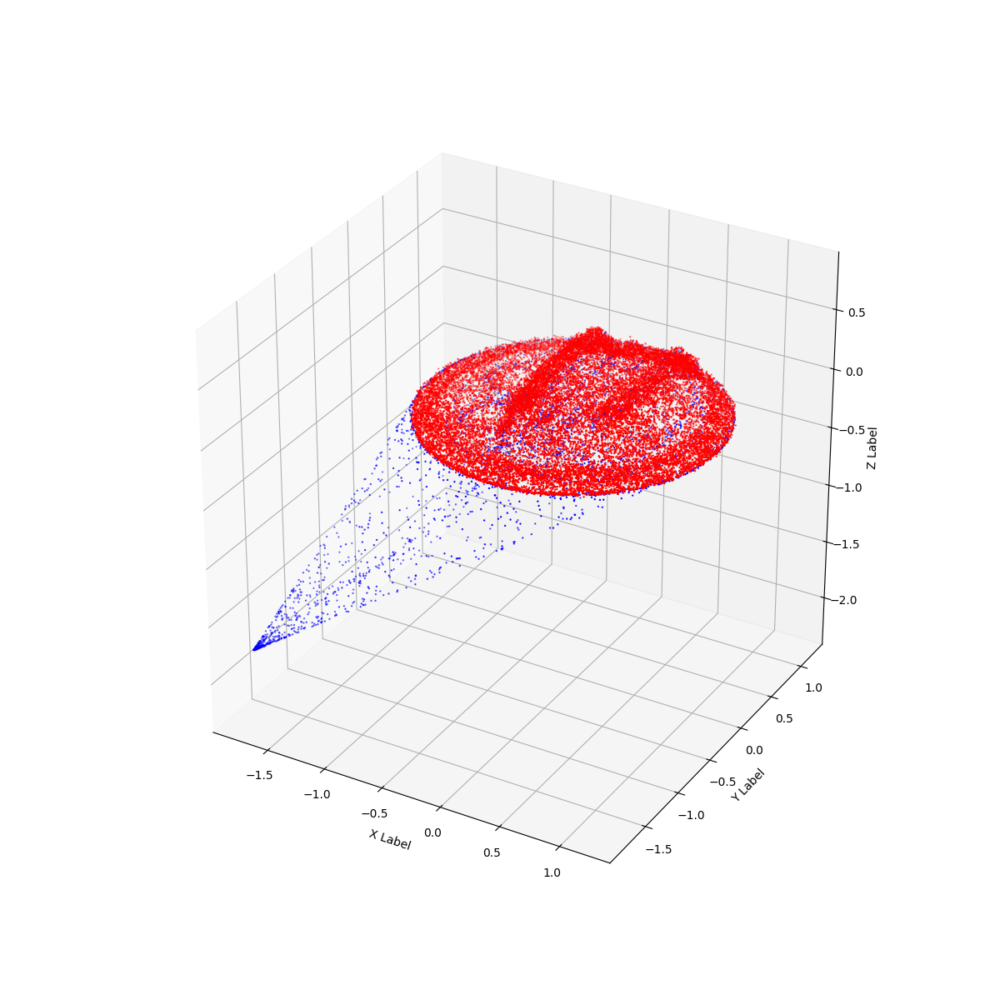

In [178]:


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=30
if True:
    arr = all_contours_coords.detach().cpu().numpy()
    
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='b', marker='o',s=.5)

# Plot the scatter points
kth=30
if True:
    #arr = content_gaussians._xyz.data.detach().cpu().numpy()
    arr = gaussians_opt._xyz.data.detach().cpu().numpy()
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='r', marker='o',s=.5)


# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()


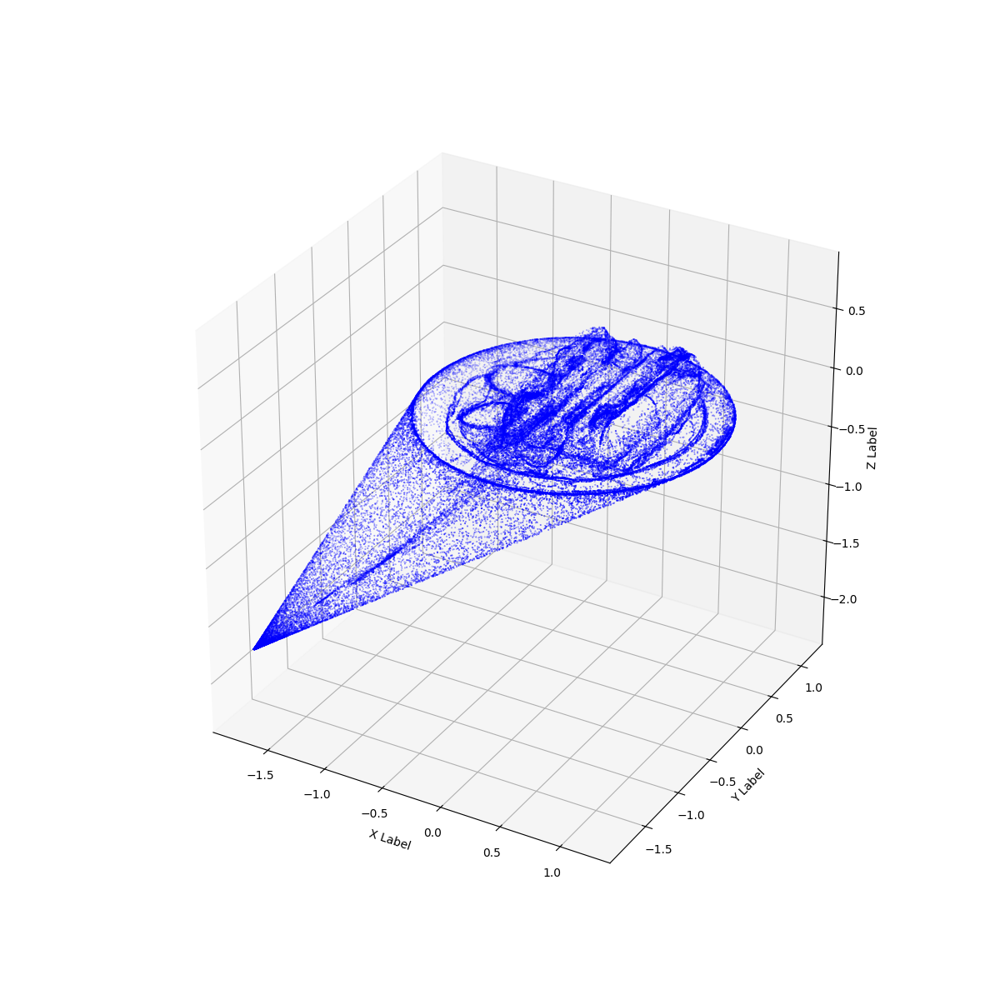

In [180]:


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
#ax.axis('equal')
ax.set_aspect('equal')
# Plot target shape

# Plot the scatter points
kth=2
if True:
    arr = all_contours_coords.detach().cpu().numpy()
    
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='b', marker='o',s=.1)

# Plot the scatter points
kth=30
if False:
    #arr = content_gaussians._xyz.data.detach().cpu().numpy()
    arr = gaussians_opt._xyz.data.detach().cpu().numpy()
    ax.scatter(arr[::kth,0], 
               arr[::kth,1], 
               arr[::kth,2], 
               c='r', marker='o',s=.5)


# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.set_box_aspect([1,1,1]) # IMPORTANT - this is the new, key line
# ax.set_proj_type('ortho') # OPTIONAL - default is perspective (shown in image above)
set_axes_equal(ax) # IMPORTANT - this is also required
plt.show()
